# Env setupu

In [1]:
import scanpy as sc, anndata as ad, numpy as np, pandas as pd
from scipy import sparse
from anndata import AnnData
from pandas.api.types import CategoricalDtype
from matplotlib import pylab
import time
import warnings
import socket
import plotly.express as px
import yaml
import holoviews as hv

import seaborn as sns
import os
import sys
import scanpy.external as sce
import matplotlib as plt

warnings.filterwarnings('ignore')

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
with open("../data/resources/rcParams.yaml") as f:
    rcParamsDict = yaml.full_load(f)
    for k in rcParamsDict["rcParams"]:
        print("{} {}".format(k,rcParamsDict["rcParams"][k]))
        plt.rcParams[k] = rcParamsDict["rcParams"][k]
    for k1 in set(list(rcParamsDict)).difference(set(["rcParams"])):
        print("{} {}".format(k1,rcParamsDict[k1]))

scanpy==1.9.3 anndata==0.8.0 umap==0.5.1 numpy==1.20.3 scipy==1.10.1 pandas==2.0.3 scikit-learn==1.3.2 statsmodels==0.13.5 python-igraph==0.9.1 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.12
figure.dpi 80
savefig.dpi 500
figure.figsize [10, 10]
axes.facecolor None
figure.facecolor None
dotSize 20


# Configure paths

In [3]:
outdir = "../data/output"
homeDir = os.getenv("HOME")
with open("../data/resources/iPSC_lines_map.yaml", 'r') as f:
    iPSC_lines_map = yaml.load(f, Loader=yaml.FullLoader)["lines"]
colorsmap = dict(zip([i["newName"] for i in iPSC_lines_map.values()],[i["color"] for i in iPSC_lines_map.values()]))
sys.path.insert(1, homeDir+"/utils/")


figDir = "./figures"
if not os.path.exists(figDir):
   # Create a new directory because it does not exist
   os.makedirs(figDir)
    
leidenOrder=["ProliferatingProgenitors","RadialGliaProgenitors","OuterRadialGliaAstrocytes","CajalR_like","Neurons","MigratingNeurons","GlutamatergicNeurons_early","GlutamatergicNeurons_late","Interneurons_GAD2","Interneurons"]
dsOrder = ['UpD50', 'DownD50', 'UpD100_1', 'UpD100_2', 'DownD100', 'UpD300', 'DownD250']
cellIDOrder = ['CTL02A', 'CTL08A', 'CTL01', 'CTL04E']

DatasetBasedirs = {
"UpD50" : "../data/Sample_S20272_157/",
"DownD50" :"../data/Sample_S20273_158/",
"UpD100_1" : "../data/Sample_S20812_258/",
"UpD100_2" : "../data/Sample_S20813_259/",
"DownD250" : "../data/Sample_S20814_260/",
"DownD100" : "../data/Sample_S31807_MET6/",
"UpD300" : "../data/Sample_S33846_C_GEX/"
}


sys.path.insert(1, homeDir+"/utils/")
from pBulk import *
from plotenrich import *

# Direct comparison between upstream and downstream

In [4]:
adataComp = sc.read(outdir+"/adatas/adataPaga.h5ad")
adataRaw = sc.read("/group/testa/Users/davide.castaldi/organoidMultiplexing_release/data/output/adatas/MultiplexingPreprocessing_unscaled.h5ad")

In [5]:
for i in [i for i in  list(adataComp.uns.keys()) if "_colors" in i]:
    print(i)

Exc_Lineage_colors
cellID_colors
cellID_newName_colors
cellID_newName_type_colors
cluster_colors
dataset_colors
leidenAnnotated_colors
leiden_1.2_colors
leiden_Filt_colors
leiden_colors
phase_colors
stage_colors
type_colors


In [6]:
adataRaw = adataRaw[adataComp.obs_names,:]
adataRaw.obs = adataComp.obs.copy()
for i in [i for i in  list(adataComp.uns.keys()) if "_colors" in i]:
    adataRaw.uns[i] = adataComp.uns[i].copy()

leidenColorsMaps = dict(zip(adataComp.obs["leidenAnnotated"].cat.categories,adataComp.uns["leidenAnnotated_colors"]))
cellIDColorsMap = dict(zip(adataComp.obs["cellID_newName"].cat.categories, adataComp.uns["cellID_newName_colors"]))


adataComp.obs["cellID_newName"].cat.categories.tolist()

['CTL01', 'CTL02A', 'CTL04E', 'CTL08A']

In [7]:
adataComp.obs[["stage","type","cellID_newName","dataset"]]
ColorDict = {}
for i in ["stage","type","cellID_newName","dataset"]:
    ColorDict[i] = dict(zip(adataComp.obs[i].cat.categories,adataComp.uns["{}_colors".format(i)]))
ColorDict["preservation"] = {"Fresh":"#C4E4FF","Fixed":"#D6589F"}

In [8]:
ColorDict

{'stage': {'early': '#ad037b', 'mid': '#01818a', 'late': '#060B4D'},
 'type': {'upstream': '#EF6F6C', 'downstream': '#3AD8DE'},
 'cellID_newName': {'CTL01': '#DBB807',
  'CTL02A': '#7B00FF',
  'CTL04E': '#FF0054',
  'CTL08A': '#0FB248'},
 'dataset': {'UpD50': '#FF00BD',
  'DownD50': '#FF8FE2',
  'UpD100_1': '#02B3A1',
  'UpD100_2': '#01818A',
  'DownD100': '#00C217',
  'UpD300': '#0C1596',
  'DownD250': '#2C344D'},
 'preservation': {'Fresh': '#C4E4FF', 'Fixed': '#D6589F'}}

# Let's Pick onyl Early and Mid timepoint for the comparison, since late upstream comprises one only genotype

In [9]:
adataRaw
adataRaw = adataRaw[adataRaw.obs["stage"].isin(["early","mid"])]
adataRaw.layers["raw"]  = adataRaw.X.copy()
sc.pp.normalize_total(adataRaw, target_sum=2e4)
sc.pp.log1p(adataRaw)
sc.tl.pca(adataRaw, use_highly_variable=False)
adataRaw.obs["preservation"] = list(np.where(adataRaw.obs["dataset"] == "DownD100", "Fixed","Fresh"))


normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:20)


## Check uncorrected variance

<Figure size 432x288 with 0 Axes>

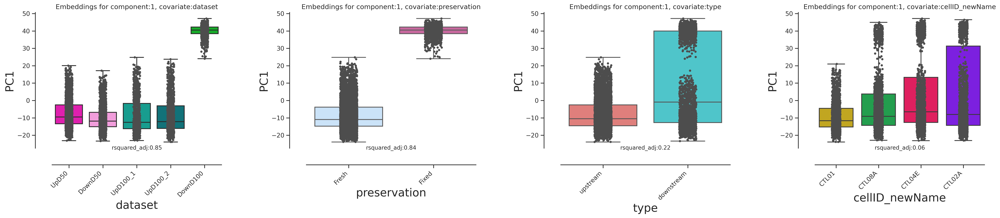

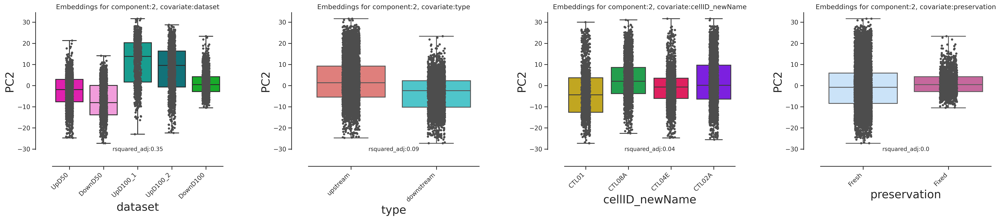

In [10]:
ColorDict = {}
for i in ["stage","type","cellID_newName","dataset","leidenAnnotated"]:
    ColorDict[i] = dict(zip(adataRaw.obs[i].cat.categories,adataRaw.uns["{}_colors".format(i)]))
ColorDict["preservation"] = {"Fresh":"#C4E4FF","Fixed":"#D6589F"}
PlotOrder = {"cellID_newName":['CTL01', 'CTL08A','CTL04E','CTL02A'],
             "stage":["early","mid"],
             "type":["upstream","downstream"],
             "preservation":["Fresh","Fixed"],
             "dataset":['UpD50','DownD50','UpD100_1','UpD100_2','DownD100']}


import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
PCRegrDict = {}
npcs = 2
covToTest = ["cellID_newName","type","dataset","preservation"]
sns.set_theme(style="ticks")
varianceSummary = pd.DataFrame()
for i in range(npcs):
	adataRaw.obsm["X_pca"]
	for n,c in enumerate(covToTest):
		Dummies = pd.get_dummies(adataRaw.obs[c])
		PCRegr = (Dummies.T * adataRaw.obsm["X_pca"][:,i].T).T.melt()
		PCRegr = PCRegr[PCRegr["value"] != 0]
		PCRegr["variable"] = PCRegr["variable"].astype("category")
		PCRegr["cov"] = c
		PCRegrDict["PC:{}_COV:{}".format(i+1,c)] = PCRegr.copy()
		sns.despine(offset=30)
		PCRegrModel = pd.get_dummies(PCRegrDict["PC:{}_COV:{}".format(i+1,c)], "variable").copy()
		formula = "".join(["value ~ "," + ".join(["C("+c+")" for c in PCRegrModel.columns[1:-1].tolist()])])
		fit = ols(formula, data=PCRegrModel).fit() 
		fit.rsquared_adj
		PCRegr["rsquared_adj"] = fit.rsquared_adj
		PCRegr["PC"] = i
		varianceSummary = pd.concat([varianceSummary,PCRegr ], ignore_index=True)

CovOrder = {i:varianceSummary.drop_duplicates(["PC","cov"])[varianceSummary.drop_duplicates(["PC","cov"])["PC"] == i].sort_values("rsquared_adj", ascending=False)["cov"].tolist() for i in varianceSummary["PC"].unique().tolist()}
for i in range(npcs):
	fig, axes = plt.subplots(1,len(covToTest), figsize=(30,5), dpi=300, sharex=False,sharey=False)
	plt.subplots_adjust(wspace=.5)
	adataRaw.obsm["X_pca"]
	for n,c in enumerate(CovOrder[i]):
		PCRegr = varianceSummary[(varianceSummary["PC"] == i) & (varianceSummary["cov"] == c)]
		sns.boxplot(data=PCRegr, x="variable", y="value", ax = axes[n],whis=[0, 100],palette=ColorDict[c], order=PlotOrder[c],hue_order=PlotOrder[c])
		sns.stripplot(data=PCRegr, x="variable", y="value", size=4, color=".3",ax = axes[n], order=PlotOrder[c],hue_order=PlotOrder[c])
		axes[n].title.set_text('Embeddings for component:{}, covariate:{}'.format(i+1,c))
		axes[n].set_xlabel(c, fontsize=20)
		axes[n].set_ylabel("PC{}".format(i+1), fontsize=20)
		sns.despine(offset=30)
		fit.rsquared_adj = PCRegr["rsquared_adj"].values[0]
		axes[n].text(0.5, 0, "rsquared_adj:{}".format(round(fit.rsquared_adj,2)), horizontalalignment='center', verticalalignment='center',transform=axes[n].transAxes)
		axes[n].tick_params(axis="x", rotation=45)
		plt.xticks(rotation=45)
		fig.autofmt_xdate(rotation=45)
		


<Figure size 432x288 with 0 Axes>

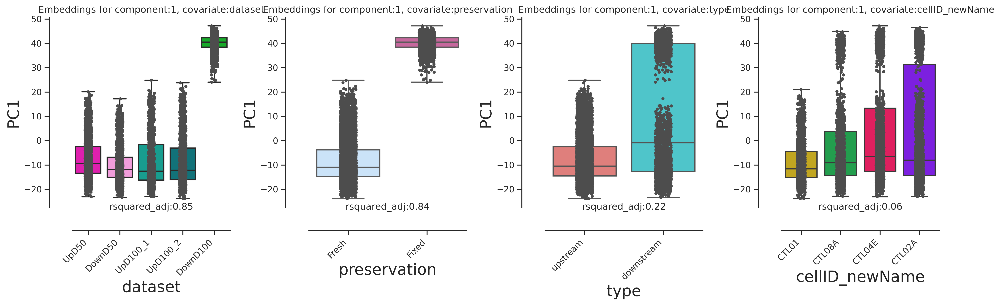

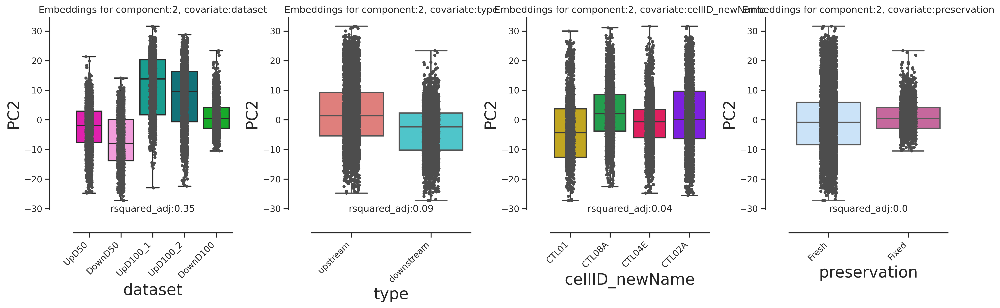

In [11]:
ColorDict = {}
for i in ["stage","type","cellID_newName","dataset","leidenAnnotated"]:
    ColorDict[i] = dict(zip(adataRaw.obs[i].cat.categories,adataRaw.uns["{}_colors".format(i)]))
ColorDict["preservation"] = {"Fresh":"#C4E4FF","Fixed":"#D6589F"}
PlotOrder = {"cellID_newName":['CTL01', 'CTL08A','CTL04E','CTL02A'],
             "stage":["early","mid"],
             "type":["upstream","downstream"],
             "preservation":["Fresh","Fixed"],
             "dataset":['UpD50','DownD50','UpD100_1','UpD100_2','DownD100']}


import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
PCRegrDict = {}
npcs = 2
covToTest = ["dataset","preservation","cellID_newName","type"]
sns.set_theme(style="ticks")
varianceSummary = pd.DataFrame()
for i in range(npcs):
	adataRaw.obsm["X_pca"]
	for n,c in enumerate(covToTest):
		Dummies = pd.get_dummies(adataRaw.obs[c])
		PCRegr = (Dummies.T * adataRaw.obsm["X_pca"][:,i].T).T.melt()
		PCRegr = PCRegr[PCRegr["value"] != 0]
		PCRegr["variable"] = PCRegr["variable"].astype("category")
		PCRegr["cov"] = c
		PCRegrDict["PC:{}_COV:{}".format(i+1,c)] = PCRegr.copy()
		sns.despine(offset=30)
		PCRegrModel = pd.get_dummies(PCRegrDict["PC:{}_COV:{}".format(i+1,c)], "variable").copy()
		formula = "".join(["value ~ "," + ".join(["C("+c+")" for c in PCRegrModel.columns[1:-1].tolist()])])
		fit = ols(formula, data=PCRegrModel).fit() 
		fit.rsquared_adj
		PCRegr["rsquared_adj"] = fit.rsquared_adj
		PCRegr["PC"] = i
		varianceSummary = pd.concat([varianceSummary,PCRegr ], ignore_index=True)

CovOrder = {i:varianceSummary.drop_duplicates(["PC","cov"])[varianceSummary.drop_duplicates(["PC","cov"])["PC"] == i].sort_values("rsquared_adj", ascending=False)["cov"].tolist() for i in varianceSummary["PC"].unique().tolist()}
for i in range(npcs):
	fig, axes = plt.subplots(1,len(covToTest), figsize=(20,5), dpi=300, sharex=False,sharey=False)
	plt.subplots_adjust(wspace=.5)
	adataRaw.obsm["X_pca"]
	for n,c in enumerate(CovOrder[i]):
		PCRegr = varianceSummary[(varianceSummary["PC"] == i) & (varianceSummary["cov"] == c)]
		sns.boxplot(data=PCRegr, x="variable", y="value", ax = axes[n],whis=[0, 100],palette=ColorDict[c], order=PlotOrder[c],hue_order=PlotOrder[c])
		sns.stripplot(data=PCRegr, x="variable", y="value", size=4, color=".3",ax = axes[n], order=PlotOrder[c],hue_order=PlotOrder[c])
		axes[n].title.set_text('Embeddings for component:{}, covariate:{}'.format(i+1,c))
		axes[n].set_xlabel(c, fontsize=20)
		axes[n].set_ylabel("PC{}".format(i+1), fontsize=20)
		sns.despine(offset=30)
		fit.rsquared_adj = PCRegr["rsquared_adj"].values[0]
		axes[n].text(0.5, 0, "rsquared_adj:{}".format(round(fit.rsquared_adj,2)), horizontalalignment='center', verticalalignment='center',transform=axes[n].transAxes)
		axes[n].tick_params(axis="x", rotation=45)
		plt.xticks(rotation=45)
		fig.autofmt_xdate(rotation=45)
		fig.savefig(figDir+"/PC{}variance.svg".format(i), bbox_inches='tight')

In [12]:
['Fixed_DownD100', 'Fresh_UpD100_1', 'Fresh_UpD100_2', 'Fresh_DownD50', 'Fresh_UpD50']
['Fresh_UpD50', 'Fresh_DownD50', 'Fresh_UpD100_1', 'Fresh_UpD100_2', 'Fixed_DownD100']

['Fresh_UpD50',
 'Fresh_DownD50',
 'Fresh_UpD100_1',
 'Fresh_UpD100_2',
 'Fixed_DownD100']

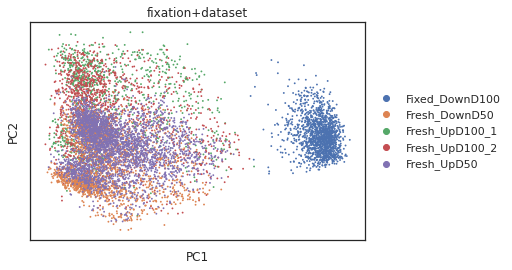

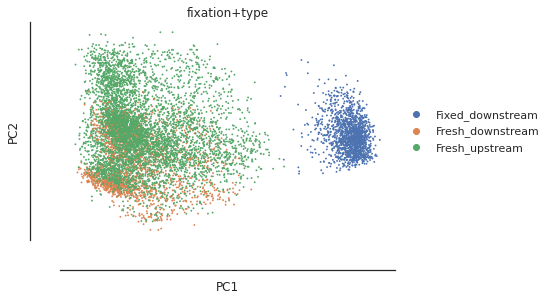

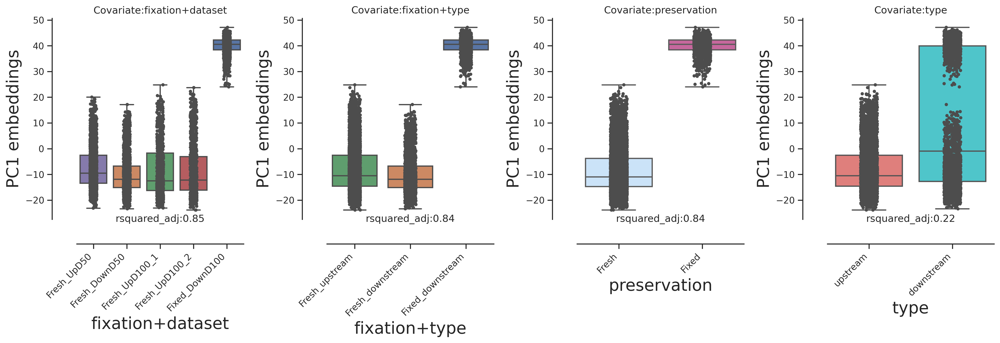

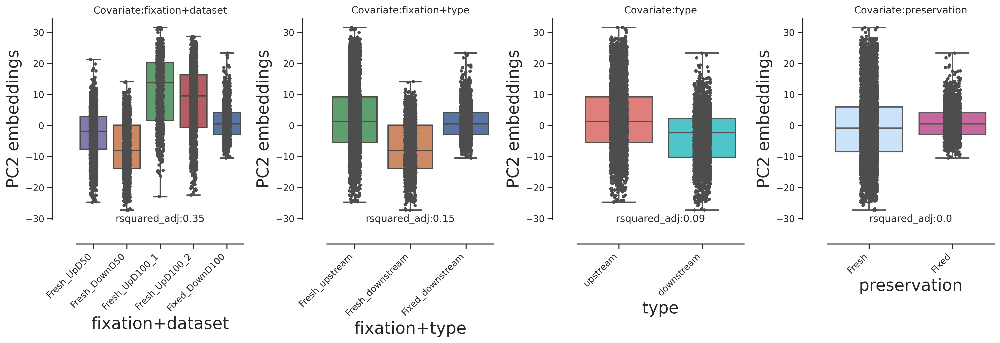

In [13]:
adataRawII = adataRaw.copy()
adataRawII.obs["fixation+dataset"] = adataRawII.obs["preservation"].astype(str) + "_" + adataRawII.obs["dataset"].astype(str)
adataRawII.obs["fixation+dataset"] = adataRawII.obs["fixation+dataset"].astype("category")
adataRawII.obs["fixation+type"] = adataRawII.obs["preservation"].astype(str) + "_" + adataRawII.obs["type"].astype(str)
adataRawII.obs["fixation+type"] = adataRawII.obs["fixation+type"].astype("category")

sc.pl.pca(adataRawII, color="fixation+dataset", show=False)
sc.pl.pca(adataRawII, color="fixation+type", show=False)

ColorDict = {}
for i in ["type","cellID_newName","leidenAnnotated","fixation+dataset","fixation+type"]:
    ColorDict[i] = dict(zip(adataRawII.obs[i].cat.categories,adataRawII.uns["{}_colors".format(i)]))
ColorDict["preservation"] = {"Fresh":"#C4E4FF","Fixed":"#D6589F"}
PlotOrder = {"cellID_newName":['CTL01', 'CTL08A','CTL04E','CTL02A'],
             "stage":["early","mid"],
             "type":["upstream","downstream"],
             "preservation":["Fresh","Fixed"],
             "dataset":['UpD50','DownD50','UpD100_1','UpD100_2','DownD100'],
             "fixation+dataset":['Fresh_UpD50', 'Fresh_DownD50', 'Fresh_UpD100_1', 'Fresh_UpD100_2', 'Fixed_DownD100'],
             "fixation+type":adataRawII.obs["fixation+type"].unique().sort_values(ascending=False).tolist()}


import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
PCRegrDict = {}
npcs = 2
covToTest = ["fixation+dataset","preservation","type","fixation+type"]
sns.set_theme(style="ticks")
varianceSummary = pd.DataFrame()
for i in range(npcs):
	adataRawII.obsm["X_pca"]
	for n,c in enumerate(covToTest):
		Dummies = pd.get_dummies(adataRawII.obs[c])
		PCRegr = (Dummies.T * adataRawII.obsm["X_pca"][:,i].T).T.melt()
		PCRegr = PCRegr[PCRegr["value"] != 0]
		PCRegr["variable"] = PCRegr["variable"].astype("category")
		PCRegr["cov"] = c
		PCRegrDict["PC:{}_COV:{}".format(i+1,c)] = PCRegr.copy()
		sns.despine(offset=30)
		PCRegrModel = pd.get_dummies(PCRegrDict["PC:{}_COV:{}".format(i+1,c)], "variable").copy()
		formula = "".join(["value ~ "," + ".join(["C("+c+")" for c in PCRegrModel.columns[1:-1].tolist()])])
		fit = ols(formula, data=PCRegrModel).fit() 
		fit.rsquared_adj
		PCRegr["rsquared_adj"] = fit.rsquared_adj
		PCRegr["PC"] = i
		varianceSummary = pd.concat([varianceSummary,PCRegr ], ignore_index=True)

CovOrder = {i:varianceSummary.drop_duplicates(["PC","cov"])[varianceSummary.drop_duplicates(["PC","cov"])["PC"] == i].sort_values("rsquared_adj", ascending=False)["cov"].tolist() for i in varianceSummary["PC"].unique().tolist()}
for i in range(npcs):
	fig, axes = plt.subplots(1,len(covToTest), figsize=(20,5), dpi=300, sharex=False,sharey=False)
	plt.subplots_adjust(wspace=.5)
	adataRawII.obsm["X_pca"]
	for n,c in enumerate(CovOrder[i]):
		PCRegr = varianceSummary[(varianceSummary["PC"] == i) & (varianceSummary["cov"] == c)]
		sns.boxplot(data=PCRegr, x="variable", y="value", ax = axes[n],whis=[0, 100],
              palette=ColorDict[c], order=PlotOrder[c],
              hue_order=PlotOrder[c])
		sns.stripplot(data=PCRegr, x="variable", y="value", size=4, color=".3",ax = axes[n], 
                order=PlotOrder[c],hue_order=PlotOrder[c])
		axes[n].title.set_text('Covariate:{}'.format(c))
		axes[n].set_xlabel(c, fontsize=20)
		axes[n].set_ylabel("PC{} embeddings".format(i+1), fontsize=20)
		sns.despine(offset=30)
		fit.rsquared_adj = PCRegr["rsquared_adj"].values[0]
		axes[n].text(0.5, 0, "rsquared_adj:{}".format(round(fit.rsquared_adj,2)), horizontalalignment='center', verticalalignment='center',transform=axes[n].transAxes)
		axes[n].tick_params(axis="x", rotation=45)
		plt.xticks(rotation=45)
		fig.autofmt_xdate(rotation=45)
		fig.savefig(figDir+"/PC{}variance.Fixation.svg".format(i), bbox_inches='tight')

In [14]:
compositions = pd.DataFrame(adataRaw.obs.groupby(["dataset","cellID_newName"]).size())

compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
fig = px.bar(compositions, x="dataset", y="number_of_cells", color="cellID_newName", 
             category_orders={"dataset":dsOrder,"cellID_newName":cellIDOrder}, height=800,width=1000, template="plotly_white",
             color_discrete_map = dict(zip(adataRaw.obs["cellID_newName"].cat.categories, adataRaw.uns["cellID_newName_colors"])))

fig.update_traces(marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=1)

fig.show()

In [15]:
compositions = pd.DataFrame(adataRaw.obs.groupby(["dataset","leidenAnnotated"]).size())

compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
fig = px.bar(compositions, x="dataset", y="number_of_cells", color="leidenAnnotated", 
             category_orders={"dataset":dsOrder,"leidenAnnotated":cellIDOrder}, height=800,width=1000, template="plotly_white",
             color_discrete_map =leidenColorsMaps)

fig.update_traces(marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=1)

fig.show()

## Early dataset 

### Check lines distribution

In [16]:
RawEarly = adataRaw[adataRaw.obs["stage"] == "early"].copy()
# First we keep only ctl01 and ctl08a
#RawEarly = RawEarly[RawEarly.obs["cellID_newName"].isin(["CTL01","CTL08A"])]

compositions = pd.DataFrame(RawEarly.obs.groupby(["dataset","cellID_newName"]).size())

compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
fig = px.bar(compositions, x="dataset", y="number_of_cells", color="cellID_newName", text="number_of_cells",
             category_orders={"dataset":dsOrder,"cellID_newName":cellIDOrder}, height=800,width=1000, template="plotly_white",
             color_discrete_map = dict(zip(RawEarly.obs["cellID_newName"].cat.categories, RawEarly.uns["cellID_newName_colors"])))

fig.update_traces(marker_line_color='rgb(8,48,107)',textposition = 'inside',
                  marker_line_width=1.5, opacity=1)


fig.update_layout(font=dict(size=25, color='black'))
fig.write_image(figDir+"/EarlyComposition.PreBalance.svg")

fig.show()





In [17]:
RawEarly = adataRaw[adataRaw.obs["stage"] == "early"].copy()
# First we keep only ctl01 and ctl08a
RawEarly = RawEarly[RawEarly.obs["cellID_newName"].isin(["CTL01","CTL08A"])]

compositions = pd.DataFrame(RawEarly.obs.groupby(["dataset","cellID_newName"]).size())

compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
fig = px.bar(compositions, x="dataset", y="number_of_cells", color="cellID_newName", text="number_of_cells",
             category_orders={"dataset":dsOrder,"cellID_newName":cellIDOrder}, height=800,width=1000, template="plotly_white",
             color_discrete_map = colorsmap)

fig.update_traces(marker_line_color='rgb(8,48,107)',textposition = 'inside',
                  marker_line_width=1.5, opacity=1)


fig.update_layout(font=dict(size=25, color='black'))

fig.show()










## Balance Celltypes

compositions = pd.DataFrame(RawEarly.obs.groupby(["cellID_newName_type","leidenAnnotated"]).size())

compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
fig = px.bar(compositions, x="cellID_newName_type", y="number_of_cells", color="leidenAnnotated", 
             category_orders={"cellID_newName_type":dsOrder,"leidenAnnotated":cellIDOrder}, height=800,width=1000, template="plotly_white",
             color_discrete_map = leidenColorsMaps)

fig.update_traces(marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=1)

fig.show()

# nmin 10 cells in each genotype for each paradigm
UsableCelltypes = pd.crosstab(RawEarly.obs["leidenAnnotated"],RawEarly.obs["cellID_newName_type"])[(pd.crosstab(RawEarly.obs["leidenAnnotated"],RawEarly.obs["cellID_newName_type"]) > 10).sum(axis = 1) == 4].index.tolist()
RawEarly = RawEarly[RawEarly.obs["leidenAnnotated"].isin(UsableCelltypes)]


BClist = []
for i in RawEarly.obs["cellID_newName"].unique().tolist():
    tmp = RawEarly[RawEarly.obs["cellID_newName"] == i]
    MinCells = pd.crosstab(tmp.obs["leidenAnnotated"],tmp.obs["type"]).min(axis = 1).to_dict()
    for mtype in tmp.obs["type"].unique().tolist():
        tmp2 =  tmp[tmp.obs["type"] == mtype]
        for ct in tmp2.obs["leidenAnnotated"].unique().tolist():
            random.seed(1)
            BClist.extend(random.sample(tmp2.obs_names[tmp2.obs["leidenAnnotated"] == ct].tolist(), MinCells[ct]))

with open('./BClist.{}.txt'.format(round(time.time())), 'w') as f:
    for line in BClist:
        f.write(f"{line}\n")

RawEarly = RawEarly[BClist]
compositions = pd.DataFrame(RawEarly.obs.groupby(["cellID_newName_type","leidenAnnotated"]).size())

compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
fig = px.bar(compositions, x="cellID_newName_type", y="number_of_cells", color="leidenAnnotated", text="number_of_cells",
             category_orders={"cellID_newName_type":dsOrder,"leidenAnnotated":cellIDOrder}, height=800,width=1000, template="plotly_white",
             color_discrete_map = leidenColorsMaps)

fig.update_traces(marker_line_color='rgb(8,48,107)',textposition = 'inside',
                  marker_line_width=1.5, opacity=1)

fig.update_xaxes(tickangle=-45)

fig.update_layout(font=dict(size=25, color='black'))
fig.write_image(figDir+"/EarlyComposition.PostBalance.svg")


fig.show()

computing PCA
    with n_comps=50
    finished (0:00:02)


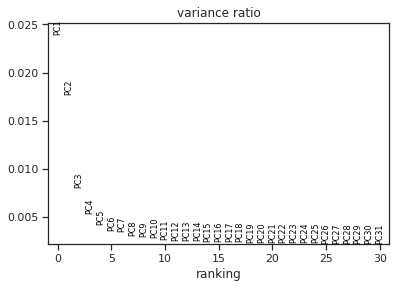

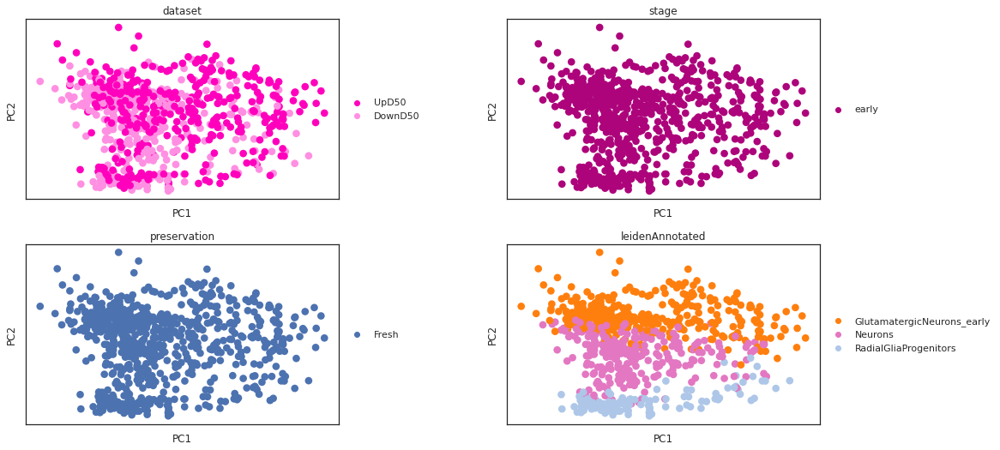

In [18]:

sc.tl.pca(RawEarly, use_highly_variable=False)
sc.pl.pca_variance_ratio(RawEarly)
sc.pl.pca(RawEarly, size = 300, color=["dataset", "stage","preservation","leidenAnnotated"], wspace=.4,ncols=2)

## Check variance early dataset

<Figure size 432x288 with 0 Axes>

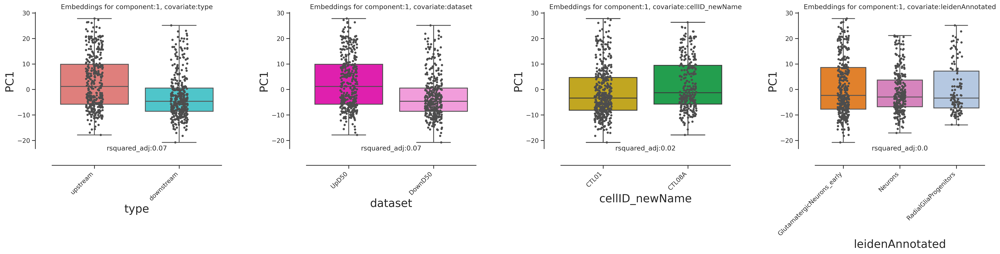

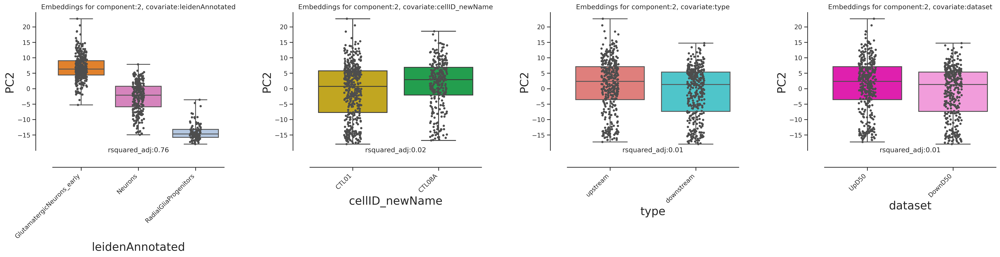

In [19]:
ColorDict = {}
for i in ["stage","type","cellID_newName","dataset","leidenAnnotated"]:
    ColorDict[i] = dict(zip(RawEarly.obs[i].cat.categories,RawEarly.uns["{}_colors".format(i)]))
ColorDict["preservation"] = {"Fresh":"#C4E4FF","Fixed":"#D6589F"}
PlotOrder = {"cellID_newName":['CTL01', 'CTL08A'],
             "stage":["early"],
             "leidenAnnotated":list(RawEarly.obs["leidenAnnotated"].cat.categories),
             "type":["upstream","downstream"],
             "preservation":["Fresh","Fixed"],
             "dataset":['UpD50','DownD50']}


import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
PCRegrDict = {}
npcs = 2
covToTest = ["cellID_newName","type","dataset","leidenAnnotated"]
sns.set_theme(style="ticks")
varianceSummary = pd.DataFrame()
for i in range(npcs):
	RawEarly.obsm["X_pca"]
	for n,c in enumerate(covToTest):
		Dummies = pd.get_dummies(RawEarly.obs[c])
		PCRegr = (Dummies.T * RawEarly.obsm["X_pca"][:,i].T).T.melt()
		PCRegr = PCRegr[PCRegr["value"] != 0]
		PCRegr["variable"] = PCRegr["variable"].astype("category")
		PCRegr["cov"] = c
		PCRegrDict["PC:{}_COV:{}".format(i+1,c)] = PCRegr.copy()
		sns.despine(offset=30)
		PCRegrModel = pd.get_dummies(PCRegrDict["PC:{}_COV:{}".format(i+1,c)], "variable").copy()
		formula = "".join(["value ~ "," + ".join(["C("+c+")" for c in PCRegrModel.columns[1:-1].tolist()])])
		fit = ols(formula, data=PCRegrModel).fit() 
		fit.rsquared_adj
		PCRegr["rsquared_adj"] = fit.rsquared_adj
		PCRegr["PC"] = i
		varianceSummary = pd.concat([varianceSummary,PCRegr ], ignore_index=True)

CovOrder = {i:varianceSummary.drop_duplicates(["PC","cov"])[varianceSummary.drop_duplicates(["PC","cov"])["PC"] == i].sort_values("rsquared_adj", ascending=False)["cov"].tolist() for i in varianceSummary["PC"].unique().tolist()}
for i in range(npcs):
	fig, axes = plt.subplots(1,len(covToTest), figsize=(30,5), dpi=300, sharex=False,sharey=False)
	plt.subplots_adjust(wspace=.5)
	RawEarly.obsm["X_pca"]
	for n,c in enumerate(CovOrder[i]):
		PCRegr = varianceSummary[(varianceSummary["PC"] == i) & (varianceSummary["cov"] == c)]
		sns.boxplot(data=PCRegr, x="variable", y="value", ax = axes[n],whis=[0, 100],palette=ColorDict[c], order=PlotOrder[c],hue_order=PlotOrder[c])
		sns.stripplot(data=PCRegr, x="variable", y="value", size=4, color=".3",ax = axes[n], order=PlotOrder[c],hue_order=PlotOrder[c])
		axes[n].title.set_text('Embeddings for component:{}, covariate:{}'.format(i+1,c))
		axes[n].set_xlabel(c, fontsize=20)
		axes[n].set_ylabel("PC{}".format(i+1), fontsize=20)
		sns.despine(offset=30)
		fit.rsquared_adj = PCRegr["rsquared_adj"].values[0]
		axes[n].text(0.5, 0, "rsquared_adj:{}".format(round(fit.rsquared_adj,2)), horizontalalignment='center', verticalalignment='center',transform=axes[n].transAxes)
		axes[n].tick_params(axis="x", rotation=45)
		plt.xticks(rotation=45)
		fig.autofmt_xdate(rotation=45)


## Let's try to replicate in mid dataset, here we want to compare the two replicates of upstream D100, since up vs down it is not possible given the different fixation

In [20]:
RawMid = adataRaw[adataRaw.obs["stage"] == "mid"].copy()
RawMid = RawMid[RawMid.obs["type"] == "upstream"].copy()
# First we keep only ctl01 and ctl08a
#RawMid = RawMid[RawMid.obs["cellID_newName"].isin(["CTL02A","CTL08A"])]
RawMid.obs["cellID_newName_dataset"] = RawMid.obs["cellID_newName"].astype(str) +"_"+RawMid.obs["dataset"].astype(str)

compositions = pd.DataFrame(RawMid.obs.groupby(["dataset","cellID_newName"]).size())

compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
fig = px.bar(compositions, x="dataset", y="number_of_cells", color="cellID_newName", text="number_of_cells",
             category_orders={"dataset":dsOrder,"cellID_newName":cellIDOrder}, height=800,width=1000, template="plotly_white",
             color_discrete_map = colorsmap)

fig.update_traces(marker_line_color='rgb(8,48,107)',textposition = 'inside',
                  marker_line_width=1.5, opacity=1)


fig.update_layout(font=dict(size=25, color='black'))
fig.write_image(figDir+"/MidComposition.PreBalance.svg")

fig.show()

In [21]:
RawMid = adataRaw[adataRaw.obs["stage"] == "mid"].copy()
RawMid = RawMid[RawMid.obs["type"] == "upstream"].copy()
# First we keep only ctl01 and ctl08a
RawMid = RawMid[RawMid.obs["cellID_newName"].isin(["CTL02A","CTL08A"])]
RawMid.obs["cellID_newName_dataset"] = RawMid.obs["cellID_newName"].astype(str) +"_"+RawMid.obs["dataset"].astype(str)

compositions = pd.DataFrame(RawMid.obs.groupby(["dataset","cellID_newName"]).size())

compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
fig = px.bar(compositions, x="dataset", y="number_of_cells", color="cellID_newName", 
             category_orders={"dataset":dsOrder,"cellID_newName":cellIDOrder}, height=800,width=1000, template="plotly_white",
             color_discrete_map = colorsmap)

fig.update_traces(marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=1)

fig.show()





## Check cell types, IDs and datasets

compositions = pd.DataFrame(RawMid.obs.groupby(["cellID_newName_dataset","leidenAnnotated"]).size())

compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
fig = px.bar(compositions, x="cellID_newName_dataset", y="number_of_cells", color="leidenAnnotated", 
             category_orders={"cellID_newName_dataset":dsOrder,"leidenAnnotated":cellIDOrder}, height=800,width=1000, template="plotly_white",
             color_discrete_map = leidenColorsMaps)

fig.update_traces(marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=1)

fig.show()

# Here we select same cell types of D50 for consistency
UsableCelltypes = ["Neurons","GlutamatergicNeurons_early","RadialGliaProgenitors"]
UsableCelltypes



['Neurons', 'GlutamatergicNeurons_early', 'RadialGliaProgenitors']

In [50]:

RawMid = RawMid[RawMid.obs["leidenAnnotated"].isin(UsableCelltypes)]


BClist = []
for i in RawMid.obs["cellID_newName"].unique().tolist():
    tmp = RawMid[RawMid.obs["cellID_newName"] == i]
    MinCells = pd.crosstab(tmp.obs["leidenAnnotated"],tmp.obs["dataset"]).min(axis = 1).to_dict()
    for mtype in tmp.obs["dataset"].unique().tolist():
        tmp2 =  tmp[tmp.obs["dataset"] == mtype]
        for ct in tmp2.obs["leidenAnnotated"].unique().tolist():
            random.seed(1)
            BClist.extend(random.sample(tmp2.obs_names[tmp2.obs["leidenAnnotated"] == ct].tolist(), MinCells[ct]))

RawMid = RawMid[BClist]
compositions = pd.DataFrame(RawMid.obs.groupby(["cellID_newName_dataset","leidenAnnotated"]).size())

compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
fig = px.bar(compositions, x="cellID_newName_dataset", y="number_of_cells", color="leidenAnnotated",  text="number_of_cells",
             category_orders={"cellID_newName_dataset":dsOrder,"leidenAnnotated":cellIDOrder}, height=800,width=1000, template="plotly_white",
             color_discrete_map = leidenColorsMaps)

fig.update_traces(marker_line_color='rgb(8,48,107)',textposition = 'inside',
                  marker_line_width=1.5, opacity=1)

fig.update_xaxes(tickangle=-45)

fig.update_layout(font=dict(size=25, color='black'))
fig.write_image(figDir+"/MidComposition.PostBalance.svg")


fig.show()

computing PCA
    with n_comps=50
    finished (0:00:00)


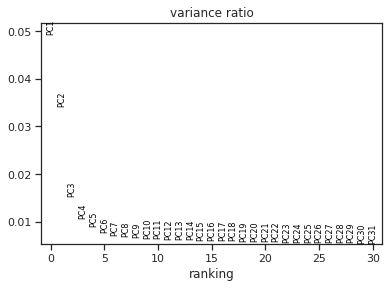

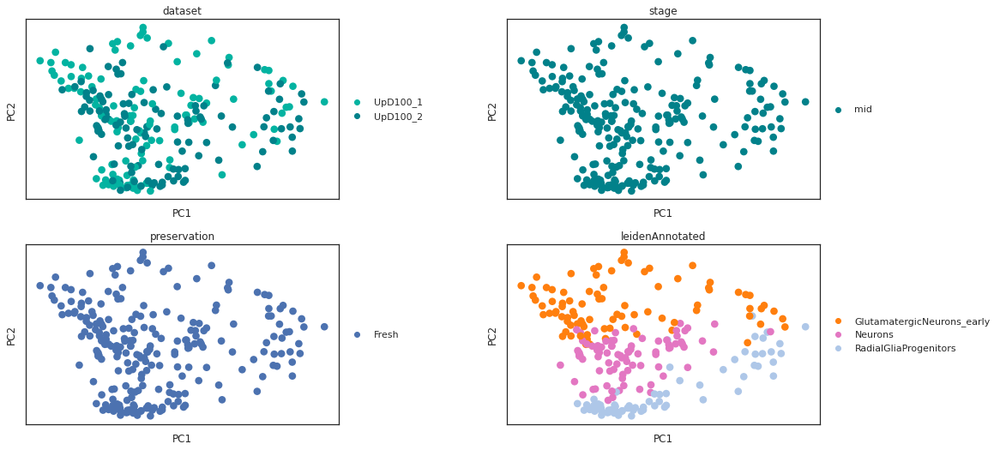

In [23]:

sc.tl.pca(RawMid, use_highly_variable=False)
sc.pl.pca_variance_ratio(RawMid)
sc.pl.pca(RawMid, size = 300, color=["dataset", "stage","preservation","leidenAnnotated"], wspace=.4,ncols=2)

## Check variance mid dataset

<Figure size 432x288 with 0 Axes>

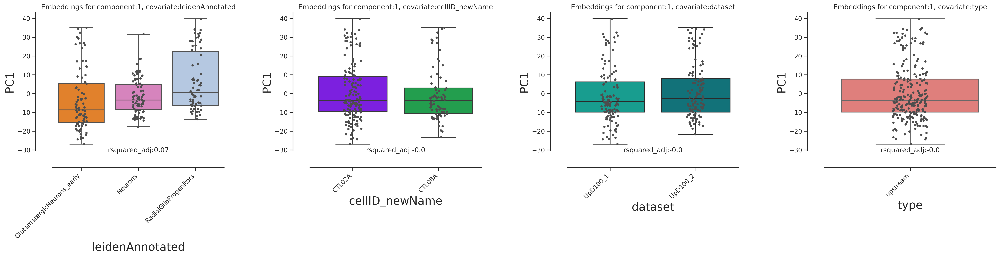

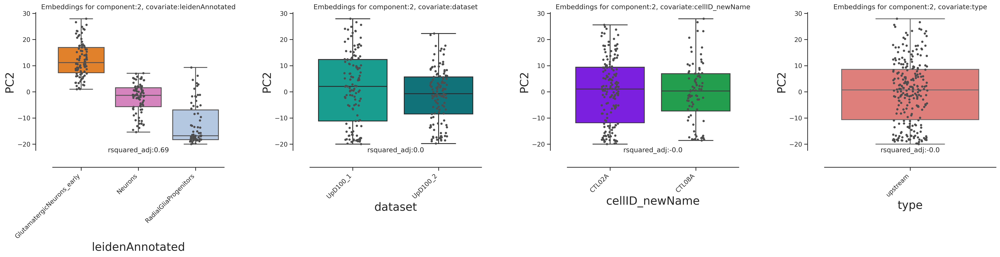

In [24]:
ColorDict = {}
for i in ["stage","type","cellID_newName","dataset","leidenAnnotated"]:
    ColorDict[i] = dict(zip(RawMid.obs[i].cat.categories,RawMid.uns["{}_colors".format(i)]))
ColorDict["preservation"] = {"Fresh":"#C4E4FF","Fixed":"#D6589F"}
PlotOrder = {"cellID_newName":['CTL02A', 'CTL08A'],
             "stage":["early"],
             "leidenAnnotated":list(RawMid.obs["leidenAnnotated"].cat.categories),
             "type":["upstream"],
             "preservation":["Fresh","Fixed"],
             "dataset":['UpD100_1','UpD100_2']}


import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
PCRegrDict = {}
npcs = 2
covToTest = ["cellID_newName","type","dataset","leidenAnnotated"]
sns.set_theme(style="ticks")
varianceSummary = pd.DataFrame()
for i in range(npcs):
	RawMid.obsm["X_pca"]
	for n,c in enumerate(covToTest):
		Dummies = pd.get_dummies(RawMid.obs[c])
		PCRegr = (Dummies.T * RawMid.obsm["X_pca"][:,i].T).T.melt()
		PCRegr = PCRegr[PCRegr["value"] != 0]
		PCRegr["variable"] = PCRegr["variable"].astype("category")
		PCRegr["cov"] = c
		PCRegrDict["PC:{}_COV:{}".format(i+1,c)] = PCRegr.copy()
		sns.despine(offset=30)
		PCRegrModel = pd.get_dummies(PCRegrDict["PC:{}_COV:{}".format(i+1,c)], "variable").copy()
		formula = "".join(["value ~ "," + ".join(["C("+c+")" for c in PCRegrModel.columns[1:-1].tolist()])])
		fit = ols(formula, data=PCRegrModel).fit() 
		fit.rsquared_adj
		PCRegr["rsquared_adj"] = fit.rsquared_adj
		PCRegr["PC"] = i
		varianceSummary = pd.concat([varianceSummary,PCRegr ], ignore_index=True)

CovOrder = {i:varianceSummary.drop_duplicates(["PC","cov"])[varianceSummary.drop_duplicates(["PC","cov"])["PC"] == i].sort_values("rsquared_adj", ascending=False)["cov"].tolist() for i in varianceSummary["PC"].unique().tolist()}
for i in range(npcs):
	fig, axes = plt.subplots(1,len(covToTest), figsize=(30,5), dpi=300, sharex=False,sharey=False)
	plt.subplots_adjust(wspace=.5)
	RawMid.obsm["X_pca"]
	for n,c in enumerate(CovOrder[i]):
		PCRegr = varianceSummary[(varianceSummary["PC"] == i) & (varianceSummary["cov"] == c)]
		sns.boxplot(data=PCRegr, x="variable", y="value", ax = axes[n],whis=[0, 100],palette=ColorDict[c], order=PlotOrder[c],hue_order=PlotOrder[c])
		sns.stripplot(data=PCRegr, x="variable", y="value", size=4, color=".3",ax = axes[n], order=PlotOrder[c],hue_order=PlotOrder[c])
		axes[n].title.set_text('Embeddings for component:{}, covariate:{}'.format(i+1,c))
		axes[n].set_xlabel(c, fontsize=20)
		axes[n].set_ylabel("PC{}".format(i+1), fontsize=20)
		sns.despine(offset=30)
		fit.rsquared_adj = PCRegr["rsquared_adj"].values[0]
		axes[n].text(0.5, 0, "rsquared_adj:{}".format(round(fit.rsquared_adj,2)), horizontalalignment='center', verticalalignment='center',transform=axes[n].transAxes)
		axes[n].tick_params(axis="x", rotation=45)
		plt.xticks(rotation=45)
		fig.autofmt_xdate(rotation=45)


# Pseudobulk DEA

In [25]:
pd.DataFrame.iteritems = pd.DataFrame.items


In [26]:
import rpy2
%load_ext rpy2.ipython

In [27]:
DEGsDictUp = {}
DEGsDictDown = {}
GeneUniverses = {}
MinCellsRate = .05

## Early only

In [28]:
adataRawPreBulk = RawEarly.copy()
adataRawPreBulk.obs["GroupFactor"] = (adataRawPreBulk.obs["cellID_newName"].astype(str)+"@"+adataRawPreBulk.obs["type"].astype(str)+"@"+ adataRawPreBulk.obs["leidenAnnotated"].astype(str)).astype("category")

SexGenes = pd.read_csv(homeDir+"/data/resources/X.genes.tsv", header=None)[0].tolist()+pd.read_csv(homeDir+"/data/resources/Y.genes.tsv", header=None)[0].tolist()
adataRawPreBulk = adataRawPreBulk[:,~adataRawPreBulk.var_names.isin(SexGenes)]
adataRawPreBulk.write_h5ad("./adataRawPreBulk_Up_VS_Down_D50.h5ad")


######################


tmp = pBulk(adataRawPreBulk, 2 , "GroupFactor", normalizepre=True,layer="raw")
PbulkadataRaw = tmp.to_df().T

Design = pd.DataFrame(index=PbulkadataRaw.columns)
Design
Design["cellID_newName"] = Design.index.to_series().str.split("@", expand=True)[0]
Design["Celltype"] = Design.index.to_series().str.split("@", expand=True)[2]
Design["Paradigm"] = Design.index.to_series().str.split("@", expand=True)[1]

Design
# # #Design["stage"] = Design.index.to_series().str.split("@", expand=True)[2]
# Design["type"] = Design.index.to_series().str.split("@", expand=True)[1]
# Design


cellID_newNameLevels = Design["cellID_newName"].unique().tolist()
ParadigmLevels = ["downstream","upstream"]

Design






Counts in raw will be aggregated
normalizing counts per cell
    finished (0:00:00)
Pbulking with target of 2 PRs will result in following cells per PR
GroupFactor
CTL01@downstream@GlutamatergicNeurons_early     49.0
CTL01@downstream@Neurons                        47.5
CTL01@downstream@RadialGliaProgenitors          20.5
CTL01@upstream@GlutamatergicNeurons_early       49.0
CTL01@upstream@Neurons                          47.5
CTL01@upstream@RadialGliaProgenitors            20.5
CTL08A@downstream@GlutamatergicNeurons_early    40.5
CTL08A@downstream@Neurons                       23.5
CTL08A@downstream@RadialGliaProgenitors          8.5
CTL08A@upstream@GlutamatergicNeurons_early      40.5
CTL08A@upstream@Neurons                         23.5
CTL08A@upstream@RadialGliaProgenitors            8.5
dtype: float64
No color mapping was possible for GroupFactor


,cellID_newName,Celltype,Paradigm
CTL01@downstream@GlutamatergicNeurons_early@0,CTL01,GlutamatergicNeurons_early,downstream
CTL01@downstream@GlutamatergicNeurons_early@1,CTL01,GlutamatergicNeurons_early,downstream
CTL01@downstream@Neurons@0,CTL01,Neurons,downstream
CTL01@downstream@Neurons@1,CTL01,Neurons,downstream
CTL01@downstream@RadialGliaProgenitors@0,CTL01,RadialGliaProgenitors,downstream
CTL01@downstream@RadialGliaProgenitors@1,CTL01,RadialGliaProgenitors,downstream
CTL01@upstream@GlutamatergicNeurons_early@0,CTL01,GlutamatergicNeurons_early,upstream
CTL01@upstream@GlutamatergicNeurons_early@1,CTL01,GlutamatergicNeurons_early,upstream
CTL01@upstream@Neurons@0,CTL01,Neurons,upstream
CTL01@upstream@Neurons@1,CTL01,Neurons,upstream


R[write to console]: Loading required package: limma



[1] 7836    8
  (Intercept) cellID_newNameCTL08A Paradigmupstream
1           1                    0                0
2           1                    0                0
3           1                    0                1
4           1                    0                1
5           1                    1                0
6           1                    1                0
7           1                    1                1
8           1                    1                1
attr(,"assign")
[1] 0 1 2
attr(,"contrasts")
attr(,"contrasts")$cellID_newName
[1] "contr.treatment"

attr(,"contrasts")$Paradigm
[1] "contr.treatment"

[1] 6489    8
  (Intercept) cellID_newNameCTL08A Paradigmupstream
1           1                    0                0
2           1                    0                0
3           1                    0                1
4           1                    0                1
5           1                    1                0
6           1                    1     

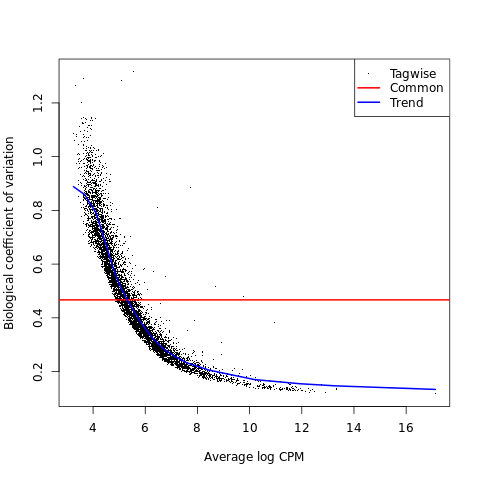

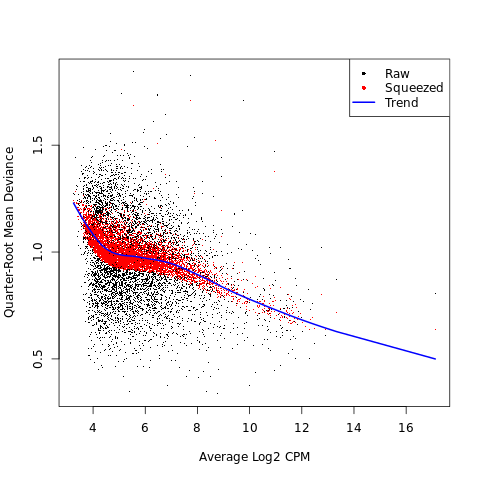

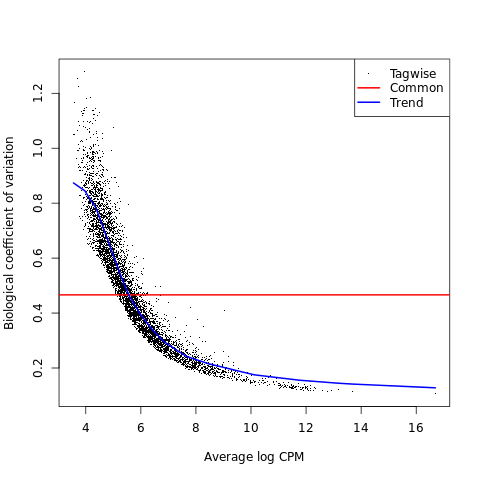

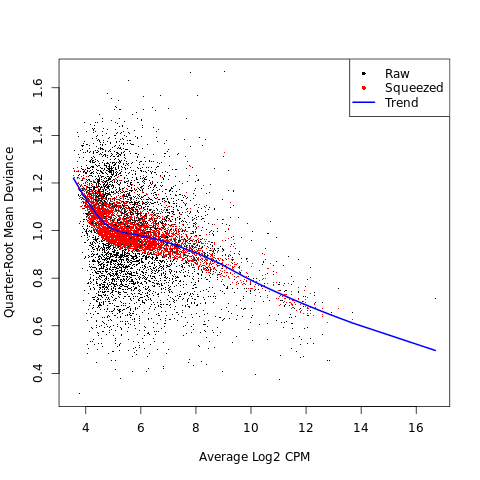

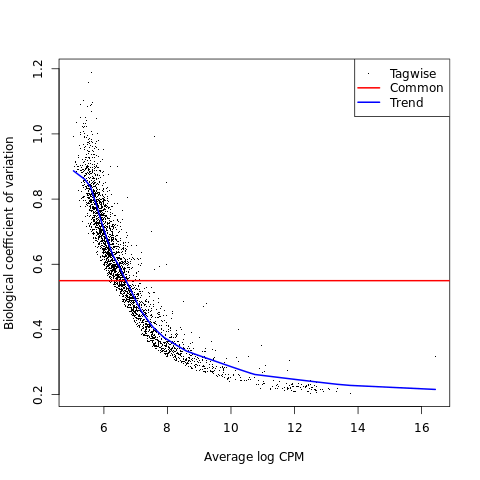

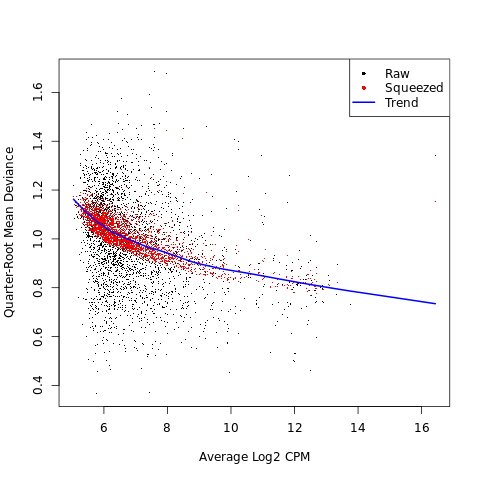

In [29]:
%%R -i PbulkadataRaw -i cellID_newNameLevels -i ParadigmLevels -i Design -o UpvsDowndf -o Universes
library(edgeR)


Universes <- list()
DEGsresults <- list()
for (i in unique(Design$Celltype)){
    DesignSS <- Design[Design$Celltype == i,]
    PbulkadataRawSS <- PbulkadataRaw[,Design$Celltype == i]
    GroupCovCat <- colnames(PbulkadataRawSS)
    y <- DGEList(counts=PbulkadataRawSS)
    
    
    
    # Set levels
    cellID_newName <- factor(DesignSS$cellID_newName, levels = cellID_newNameLevels)
    Paradigm <- factor(DesignSS$Paradigm, levels = ParadigmLevels)

    #Filter genes
    genesDF <- data.frame(rownames(y), stringsAsFactors=FALSE)
    colnames(genesDF) <- c("SYMBOL")
    y$genes <- genesDF
    keep <- filterByExpr(y,group=Paradigm)
    
    
    y <- y[keep,,keep.lib.sizes=FALSE]
    print(dim(y))
    Universes[[i]] <- rownames(y)

    #norm
    y <- calcNormFactors(y)


    #set design matrix
    design <- model.matrix(~ cellID_newName+Paradigm)
    print(design)
    
    #Dispersion
    y <- estimateDisp(y, design, robust=TRUE)
    plotBCV(y)


    #fit
    fit <- glmQLFit(y, design, robust=TRUE)
    plotQLDisp(fit)
    
    #test
    DEGsresults[[i]] <- as.data.frame(topTags(glmQLFTest(fit), adjust.method="fdr",p.value = 0.05, n = 20000))
    DEGsresults[[i]]$contrast <- i 
}


UpvsDowndf <- do.call("rbind", DEGsresults)

In [30]:
Uni1 = [l for l in Universes[0]]
Uni2 = [l for l in Universes[1]]
Uni3 = [l for l in Universes[2]]
UniverseGenes = set(Uni1+Uni2+Uni3)


In [31]:
UniverseGenes = set(Uni1+Uni2+Uni3)

### Save

In [32]:
UpvsDowndf.shape

(340, 7)

In [33]:
UpvsDowndf = UpvsDowndf.reset_index(drop=True)
UpvsDowndf["Upregulated"] = np.where(UpvsDowndf["logFC"] > 0,"Mosaic","Downstream")
UpvsDowndf.to_excel(outdir+"/Mosaic_VS_Downstream.Day50.xlsx")

In [34]:
pd.DataFrame(UniverseGenes, columns=["SYMBOL"]).to_excel(outdir+"/Mosaic_VS_Downstream.Day50.Universe.xlsx")

### Enrichment analysis prepare msigdb via decoupler

In [35]:
import decoupler as dc

msigdb = dc.get_resource('MSigDB')
msigdb

,genesymbol,collection,geneset
0,MAFF,chemical_and_genetic_perturbations,BOYAULT_LIVER_CANCER_SUBCLASS_G56_DN
1,MAFF,chemical_and_genetic_perturbations,ELVIDGE_HYPOXIA_UP
2,MAFF,chemical_and_genetic_perturbations,NUYTTEN_NIPP1_TARGETS_DN
3,MAFF,immunesigdb,GSE17721_POLYIC_VS_GARDIQUIMOD_4H_BMDC_DN
4,MAFF,chemical_and_genetic_perturbations,SCHAEFFER_PROSTATE_DEVELOPMENT_12HR_UP
...,...,...,...
3838543,PRAMEF22,go_biological_process,GOBP_POSITIVE_REGULATION_OF_CELL_POPULATION_PR...
3838544,PRAMEF22,go_biological_process,GOBP_APOPTOTIC_PROCESS
3838545,PRAMEF22,go_biological_process,GOBP_REGULATION_OF_CELL_DEATH
3838546,PRAMEF22,go_biological_process,GOBP_NEGATIVE_REGULATION_OF_DEVELOPMENTAL_PROCESS


In [36]:
# Filter by hallmark
msigdb = msigdb[msigdb['collection']=='hallmark']

# Remove duplicated entries
msigdb = msigdb[~msigdb.duplicated(['geneset', 'genesymbol'])]

# Rename
msigdb.loc[:, 'geneset'] = [name.split('HALLMARK_')[1] for name in msigdb['geneset']]

msigdb

,genesymbol,collection,geneset
233,MAFF,hallmark,IL2_STAT5_SIGNALING
250,MAFF,hallmark,COAGULATION
270,MAFF,hallmark,HYPOXIA
373,MAFF,hallmark,TNFA_SIGNALING_VIA_NFKB
377,MAFF,hallmark,COMPLEMENT
...,...,...,...
1449668,STXBP1,hallmark,PANCREAS_BETA_CELLS
1450315,ELP4,hallmark,PANCREAS_BETA_CELLS
1450526,GCG,hallmark,PANCREAS_BETA_CELLS
1450731,PCSK2,hallmark,PANCREAS_BETA_CELLS


### Enrichment analysis with genes upregulated in mosaics

In [37]:


# Run ORA
enr_pvals = dc.get_ora_df(
    df=UpvsDowndf.loc[(UpvsDowndf["FDR"] < 0.05) & (UpvsDowndf["logFC"] > 1),"SYMBOL"].tolist(),
    net=msigdb,
    source='geneset',
    target='genesymbol'
)

enr_pvals = enr_pvals[enr_pvals["FDR p-value"] < 0.05].sort_values('FDR p-value', ascending=True)
enr_pvals

,Term,Set size,Overlap ratio,p-value,FDR p-value,Odds ratio,Combined score,Features
12,HYPOXIA,200,0.080000,2.205200e-17,7.497681e-16,21.872048,838.861465,ALDOC;DDIT4;DUSP1;ENO1;ENO2;FAM162A;FOS;GPI;IE...
10,GLYCOLYSIS,200,0.050000,3.288953e-09,3.727480e-08,12.881167,251.603918,DDIT4;ENO1;ENO2;FAM162A;IER3;LDHA;P4HA1;PFKP;P...
29,TNFA_SIGNALING_VIA_NFKB,200,0.050000,3.288953e-09,3.727480e-08,12.881167,251.603918,DUSP1;EGR1;FOS;ID2;IER2;IER3;IER5;JUN;JUNB;PPP...
20,MTORC1_SIGNALING,200,0.040000,7.446935e-07,5.063916e-06,10.174821,143.569700,DDIT4;ENO1;GPI;IFRD1;LDHA;P4HA1;PFKL;PPP1R15A
24,P53_PATHWAY,199,0.040201,7.170122e-07,5.063916e-06,10.226339,144.684007,DDIT4;FAM162A;FOS;IER3;IER5;JUN;NHLH2;PPP1R15A
6,EPITHELIAL_MESENCHYMAL_TRANSITION,200,0.030000,9.766015e-05,5.534075e-04,7.596585,70.146999,ENO2;ID2;IGFBP2;JUN;MEST;SCG2
32,UV_RESPONSE_UP,158,0.031646,2.998664e-04,1.456494e-03,8.053111,65.328235,DNAJB1;ENO2;FOS;IGFBP2;JUNB
18,KRAS_SIGNALING_UP,200,0.025000,8.760872e-04,3.723371e-03,6.352700,44.723294,GADD45G;ID2;PPP1R15A;SCG5;SNAP25
28,TGF_BETA_SIGNALING,54,0.055556,1.053252e-03,3.978950e-03,14.639633,100.367468,ID2;JUNB;PPP1R15A
26,REACTIVE_OXYGEN_SPECIES_PATHWAY,49,0.040816,1.419620e-02,4.826708e-02,11.385893,48.444480,JUNB;PFKP


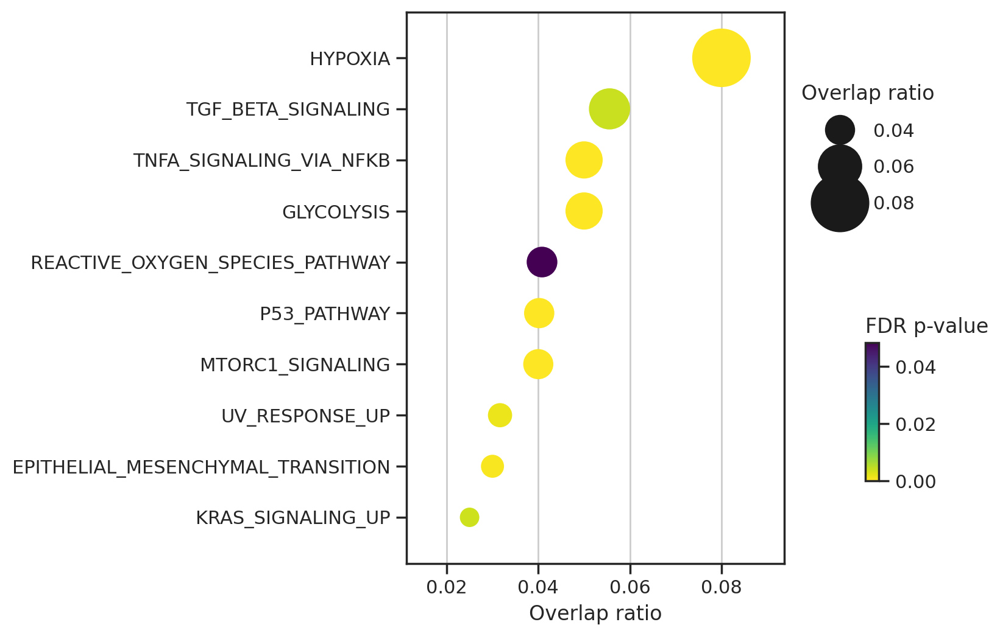

In [38]:
dc.plot_dotplot(
    enr_pvals,dpi=200,
    x='Overlap ratio',
    y='Term',
    s='Overlap ratio',
    c='FDR p-value',
    scale=70,
    figsize=(5, 6),save=figDir+"/ORA_upstreamUp.pdf"
)



### Enrichment analysis with genes upregulated in downstreams

In [39]:


# Run ORA
enr_pvals = dc.get_ora_df(
    df=UpvsDowndf.loc[(UpvsDowndf["FDR"] < 0.05) & (UpvsDowndf["logFC"] < -1),"SYMBOL"].tolist(),
    net=msigdb,
    source='geneset',
    target='genesymbol'
)

enr_pvals = enr_pvals[enr_pvals["FDR p-value"] < 0.05].sort_values('FDR p-value', ascending=True)
enr_pvals

,Term,Set size,Overlap ratio,p-value,FDR p-value,Odds ratio,Combined score,Features
9,OXIDATIVE_PHOSPHORYLATION,200,0.025,0.000037,0.000511,11.680771,119.353313,ATP5ME;COX17;NDUFA3;NDUFC1;UQCRQ


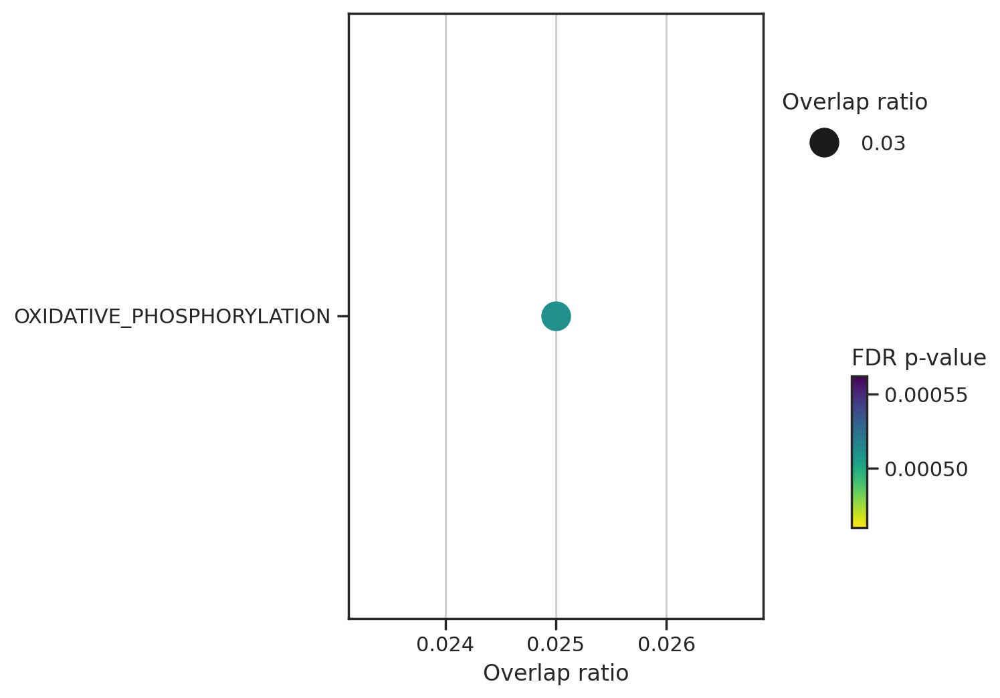

In [40]:
dc.plot_dotplot(
    enr_pvals,dpi=200,
    x='Overlap ratio',
    y='Term',
    s='Overlap ratio',
    c='FDR p-value',
    scale=100,
    figsize=(5, 6),save=figDir+"/ORA_upstreamDown.pdf"
)

## Now Mid only to compare the difference between up and down to the difference among replicates 

In [41]:
adataRawPreBulk = RawMid.copy()
adataRawPreBulk.obs["GroupFactor"] = (adataRawPreBulk.obs["cellID_newName"].astype(str)+"@"+adataRawPreBulk.obs["dataset"].astype(str)+"@"+ adataRawPreBulk.obs["leidenAnnotated"].astype(str)).astype("category")

SexGenes = pd.read_csv(homeDir+"/data/resources/X.genes.tsv", header=None)[0].tolist()+pd.read_csv(homeDir+"/data/resources/Y.genes.tsv", header=None)[0].tolist()
adataRawPreBulk = adataRawPreBulk[:,~adataRawPreBulk.var_names.isin(SexGenes)]


######################



PbulkadataRaw = pBulk(adataRawPreBulk, 2 , "GroupFactor", normalizepre=True,layer="raw").to_df().T

Design = pd.DataFrame(index=PbulkadataRaw.columns)
Design
Design["cellID_newName"] = Design.index.to_series().str.split("@", expand=True)[0]
Design["Celltype"] = Design.index.to_series().str.split("@", expand=True)[2]
Design["DS"] = Design.index.to_series().str.split("@", expand=True)[1]

Design
# # #Design["stage"] = Design.index.to_series().str.split("@", expand=True)[2]
# Design["type"] = Design.index.to_series().str.split("@", expand=True)[1]
# Design


cellID_newNameLevels = Design["cellID_newName"].unique().tolist()
dsLevels = ["UpD100_1","UpD100_2"]

Design






Counts in raw will be aggregated
normalizing counts per cell
    finished (0:00:00)
Pbulking with target of 2 PRs will result in following cells per PR
GroupFactor
CTL02A@UpD100_1@GlutamatergicNeurons_early    14.0
CTL02A@UpD100_1@Neurons                       13.5
CTL02A@UpD100_1@RadialGliaProgenitors         12.0
CTL02A@UpD100_2@GlutamatergicNeurons_early    14.0
CTL02A@UpD100_2@Neurons                       13.5
CTL02A@UpD100_2@RadialGliaProgenitors         12.0
CTL08A@UpD100_1@GlutamatergicNeurons_early     8.0
CTL08A@UpD100_1@Neurons                        7.5
CTL08A@UpD100_1@RadialGliaProgenitors          5.5
CTL08A@UpD100_2@GlutamatergicNeurons_early     8.0
CTL08A@UpD100_2@Neurons                        7.5
CTL08A@UpD100_2@RadialGliaProgenitors          5.5
dtype: float64
No color mapping was possible for GroupFactor


,cellID_newName,Celltype,DS
CTL02A@UpD100_1@GlutamatergicNeurons_early@0,CTL02A,GlutamatergicNeurons_early,UpD100_1
CTL02A@UpD100_1@GlutamatergicNeurons_early@1,CTL02A,GlutamatergicNeurons_early,UpD100_1
CTL02A@UpD100_1@Neurons@0,CTL02A,Neurons,UpD100_1
CTL02A@UpD100_1@Neurons@1,CTL02A,Neurons,UpD100_1
CTL02A@UpD100_1@RadialGliaProgenitors@0,CTL02A,RadialGliaProgenitors,UpD100_1
CTL02A@UpD100_1@RadialGliaProgenitors@1,CTL02A,RadialGliaProgenitors,UpD100_1
CTL02A@UpD100_2@GlutamatergicNeurons_early@0,CTL02A,GlutamatergicNeurons_early,UpD100_2
CTL02A@UpD100_2@GlutamatergicNeurons_early@1,CTL02A,GlutamatergicNeurons_early,UpD100_2
CTL02A@UpD100_2@Neurons@0,CTL02A,Neurons,UpD100_2
CTL02A@UpD100_2@Neurons@1,CTL02A,Neurons,UpD100_2


[1] 3990    8
  (Intercept) cellID_newNameCTL08A DSUpD100_2
1           1                    0          0
2           1                    0          0
3           1                    0          1
4           1                    0          1
5           1                    1          0
6           1                    1          0
7           1                    1          1
8           1                    1          1
attr(,"assign")
[1] 0 1 2
attr(,"contrasts")
attr(,"contrasts")$cellID_newName
[1] "contr.treatment"

attr(,"contrasts")$DS
[1] "contr.treatment"

[1] "GlutamatergicNeurons_early"
[1] 3355    8
  (Intercept) cellID_newNameCTL08A DSUpD100_2
1           1                    0          0
2           1                    0          0
3           1                    0          1
4           1                    0          1
5           1                    1          0
6           1                    1          0
7           1                    1          1
8         

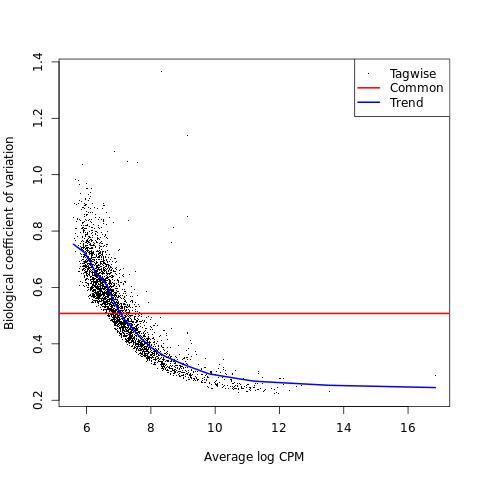

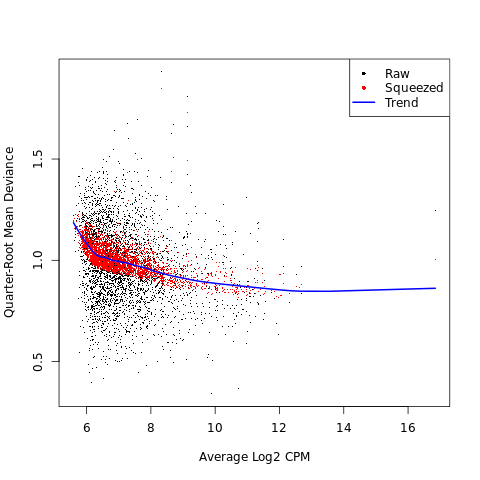

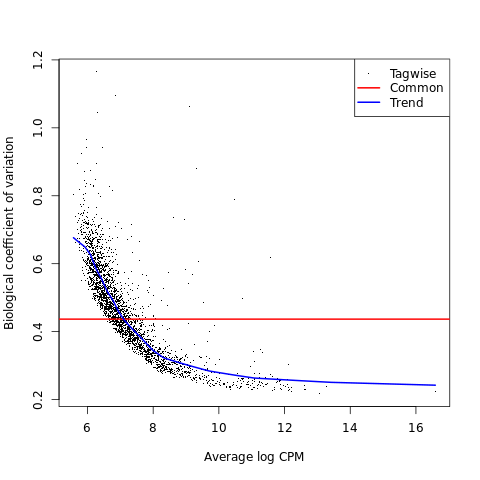

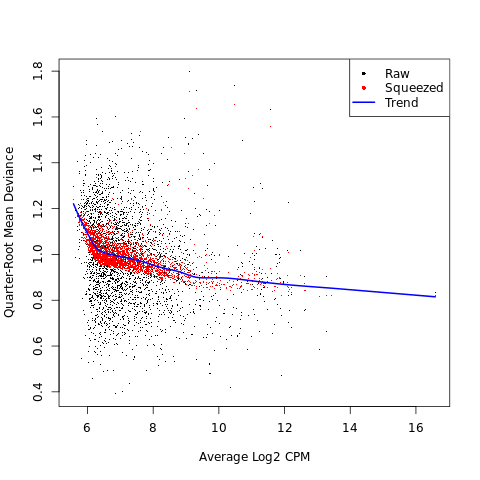

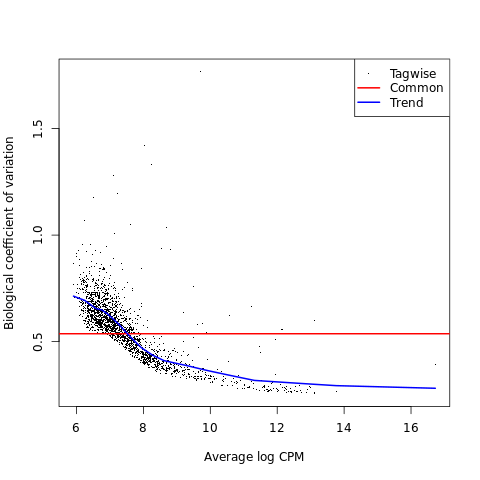

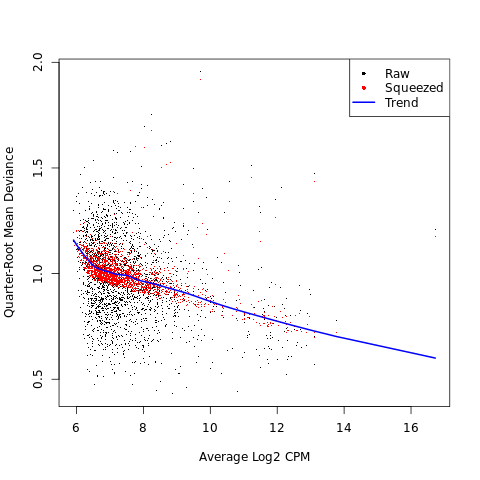

In [42]:
%%R -i PbulkadataRaw -i cellID_newNameLevels -i dsLevels -i Design -o UpReplicatesDF -o Universes
library(edgeR)


Universes <- list()
DEGsresults <- list()
for (i in unique(Design$Celltype)){
    DesignSS <- Design[Design$Celltype == i,]
    PbulkadataRawSS <- PbulkadataRaw[,Design$Celltype == i]
    GroupCovCat <- colnames(PbulkadataRawSS)
    y <- DGEList(counts=PbulkadataRawSS)
    
    
    
    # Set levels
    cellID_newName <- factor(DesignSS$cellID_newName, levels = cellID_newNameLevels)
    DS <- factor(DesignSS$DS, levels = dsLevels)

    #Filter genes
    genesDF <- data.frame(rownames(y), stringsAsFactors=FALSE)
    colnames(genesDF) <- c("SYMBOL")
    y$genes <- genesDF
    keep <- filterByExpr(y,group=DS)
    
    
    y <- y[keep,,keep.lib.sizes=FALSE]
    print(dim(y))
    #Universes[[i]] <- rownames(y)

    #norm
    y <- calcNormFactors(y)


    #set design matrix
    design <- model.matrix(~ cellID_newName+DS)
    print(design)
    
    #Dispersion
    y <- estimateDisp(y, design, robust=TRUE)
    plotBCV(y)


    #fit
    fit <- glmQLFit(y, design, robust=TRUE)
    plotQLDisp(fit)
    
    #test
    print(i)
    res <- as.data.frame(topTags(glmQLFTest(fit), adjust.method="fdr",p.value = 0.05, n = 20000))
    if (nrow(res) > 0){
        DEGsresults[[i]] <- res
        DEGsresults[[i]]$contrast <- i 
        }
}


UpReplicatesDF <- do.call("rbind", DEGsresults)

### Save

In [43]:
UpReplicatesDF["Upregulated"] = np.where(UpReplicatesDF["logFC"] > 0,"Rep1","Rep2")
UpReplicatesDF


,SYMBOL,logFC,logCPM,F,PValue,FDR,contrast,Upregulated
GlutamatergicNeurons_early.DNER,DNER,-1.782311,9.571377,36.537693,0.000006,0.024174,GlutamatergicNeurons_early,Rep2
GlutamatergicNeurons_early.RPL7,RPL7,1.098254,11.104397,30.699268,0.000019,0.037481,GlutamatergicNeurons_early,Rep1
Neurons.FDFT1,FDFT1,1.963937,8.028557,29.858559,0.000018,0.049303,Neurons,Rep1
Neurons.NEFL,NEFL,3.919222,8.256737,36.262013,0.000029,0.049303,Neurons,Rep1
RadialGliaProgenitors,CRABP1,5.072032,8.999131,46.326816,0.000007,0.018858,RadialGliaProgenitors,Rep1


In [44]:
UpReplicatesDF = UpReplicatesDF.reset_index(drop=True)
UpReplicatesDF.to_excel(outdir+"/D100.1_VS_D100.2.Day50.xlsx")

# Compare DEGs

In [45]:
FDRthresh = 0.05
logFCthresh = 1.5

In [46]:
UpvsDowndf["comparison"] = "Upstream_vs_Downstream"

UpReplicatesDF["comparison"] = "UpReplicate1_vs_UpReplicate2"

OverallContrsts = pd.concat([UpvsDowndf,UpReplicatesDF], ignore_index=True)
#OverallContrsts = OverallContrsts[OverallContrsts["significant"] != "notSignificant"]
# OverallContrsts = pd.concat([OverallContrsts,pd.DataFrame({"genes":OverallContrsts.genes.unique().tolist(),
#                                                            "logFC":0,"significant":"notSignificant",
#                                                            "Contrast":"distal"})])
OverallContrsts["significant"] = np.where((OverallContrsts["FDR"] < FDRthresh) & (abs(OverallContrsts["logFC"]) > logFCthresh), "Significant","notSignificant")
OverallContrsts["significant"] = np.where((OverallContrsts["significant"] != "notSignificant") & (OverallContrsts["logFC"] > 0), "Up",OverallContrsts["significant"])
OverallContrsts["significant"] = np.where((OverallContrsts["significant"] != "notSignificant") & (OverallContrsts["logFC"] < 0), "Down",OverallContrsts["significant"])

OverallContrsts["significant"] = pd.Categorical(OverallContrsts.significant, categories = ['notSignificant','Up', 'Down'],ordered=True)



#OverallContrsts["Contrast"] = pd.Categorical(OverallContrsts.Contrast, categories = ['Up_vs_Down','Replicate1_vs_Replicate2','distal'],ordered=True)
OverallContrsts["ABSlogFC"] = abs(OverallContrsts["logFC"])
OverallContrsts



,SYMBOL,logFC,logCPM,F,PValue,FDR,contrast,Upregulated,comparison,significant,ABSlogFC
0,RPL37A,-1.073070,11.490458,207.734743,8.505292e-12,3.671379e-08,GlutamatergicNeurons_early,Downstream,Upstream_vs_Downstream,notSignificant,1.073070
1,RPS29,-1.245380,10.712282,205.479835,9.370544e-12,3.671379e-08,GlutamatergicNeurons_early,Downstream,Upstream_vs_Downstream,notSignificant,1.245380
2,IGFBP2,2.078248,10.028803,188.899990,1.971587e-11,5.149786e-08,GlutamatergicNeurons_early,Mosaic,Upstream_vs_Downstream,Up,2.078248
3,ENO1,1.422903,10.298645,181.282596,2.831450e-11,5.546811e-08,GlutamatergicNeurons_early,Mosaic,Upstream_vs_Downstream,notSignificant,1.422903
4,RPS27,-1.155306,11.593853,175.601632,3.742819e-11,5.865746e-08,GlutamatergicNeurons_early,Downstream,Upstream_vs_Downstream,notSignificant,1.155306
...,...,...,...,...,...,...,...,...,...,...,...
340,DNER,-1.782311,9.571377,36.537693,6.058603e-06,2.417383e-02,GlutamatergicNeurons_early,Rep2,UpReplicate1_vs_UpReplicate2,Down,1.782311
341,RPL7,1.098254,11.104397,30.699268,1.878743e-05,3.748093e-02,GlutamatergicNeurons_early,Rep1,UpReplicate1_vs_UpReplicate2,notSignificant,1.098254
342,FDFT1,1.963937,8.028557,29.858559,1.819401e-05,4.930347e-02,Neurons,Rep1,UpReplicate1_vs_UpReplicate2,Up,1.963937
343,NEFL,3.919222,8.256737,36.262013,2.939104e-05,4.930347e-02,Neurons,Rep1,UpReplicate1_vs_UpReplicate2,Up,3.919222


In [47]:




OverallContrstsSS = OverallContrsts[(OverallContrsts["significant"] != "notSignificant")]
#OverallContrstsSS["Contrast"] = OverallContrstsSS["Contrast"].astype("string")
OverallContrstsSS["significant"] = OverallContrstsSS["significant"].astype("string")
OverallContrstsSS = OverallContrstsSS.groupby(["comparison","contrast","significant"], as_index=False).size()

OverallContrstsSS["comparison"] = pd.Categorical(OverallContrstsSS.comparison, categories = ['Upstream_vs_Downstream','UpReplicate1_vs_UpReplicate2'],ordered=True)
OverallContrstsSS




,comparison,contrast,significant,size
0,UpReplicate1_vs_UpReplicate2,GlutamatergicNeurons_early,Down,1
1,UpReplicate1_vs_UpReplicate2,Neurons,Up,2
2,UpReplicate1_vs_UpReplicate2,RadialGliaProgenitors,Up,1
3,Upstream_vs_Downstream,GlutamatergicNeurons_early,Down,9
4,Upstream_vs_Downstream,GlutamatergicNeurons_early,Up,26
5,Upstream_vs_Downstream,Neurons,Down,8
6,Upstream_vs_Downstream,Neurons,Up,21
7,Upstream_vs_Downstream,RadialGliaProgenitors,Down,1
8,Upstream_vs_Downstream,RadialGliaProgenitors,Up,4


In [48]:
OverallContrstsSS.groupby(["comparison","significant"], as_index=False)["size"].sum()

,comparison,significant,size
0,Upstream_vs_Downstream,Down,18
1,Upstream_vs_Downstream,Up,51
2,UpReplicate1_vs_UpReplicate2,Down,1
3,UpReplicate1_vs_UpReplicate2,Up,3


                     comparison significant  size
0        Upstream_vs_Downstream        Down    18
1        Upstream_vs_Downstream          Up    51
2  UpReplicate1_vs_UpReplicate2        Down     1
3  UpReplicate1_vs_UpReplicate2          Up     3


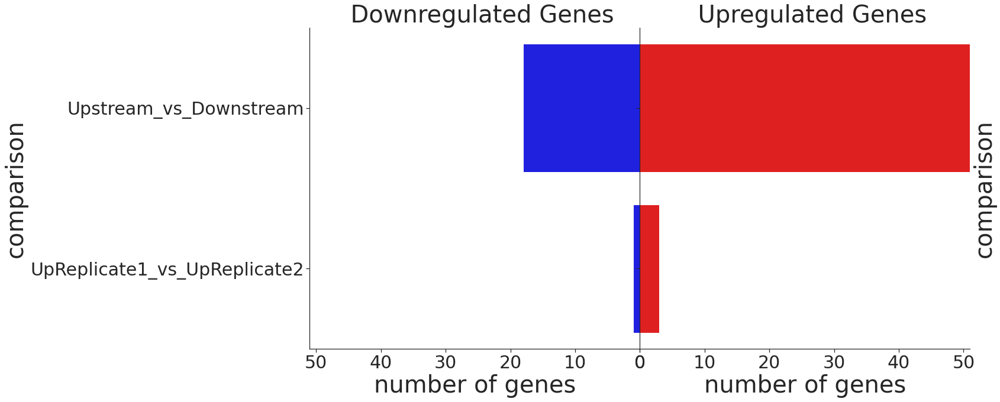

In [49]:
import matplotlib.patches as mpatches




OverallContrstsSSCT = OverallContrstsSS.groupby(["comparison","significant"], as_index=False)["size"].sum().copy()
print(OverallContrstsSSCT)

sns.axes_style("ticks",{'axes.grid' : False})
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 10), sharey=True, gridspec_kw={'wspace': 0})
sns.barplot(data=OverallContrstsSSCT[OverallContrstsSSCT['significant'] == 'Up'], x='size', y='comparison',color="red",
            ci=False, orient='horizontal', dodge=True, ax=ax2)
ax2.yaxis.set_label_position('right')
ax2.tick_params(axis='y', labelright=True, right=True)
ax2.set_title('  '+'Upregulated Genes', fontsize=40)
ax2.set_xlabel('number of genes')
ax2.xaxis.get_label().set_fontsize(40)
ax2.yaxis.get_label().set_fontsize(40)

ax2.grid(False)
ax2.tick_params(labelright=False, right=False)
ax2.set_xlim(0,OverallContrstsSSCT["size"].max())
ax2.tick_params(labelsize=30)



sns.barplot(data=OverallContrstsSSCT[OverallContrstsSSCT['significant'] == 'Down'], x='size', y='comparison',color="blue",
            ci=False, orient='horizontal', dodge=True, ax=ax1)
ax1.invert_xaxis()
ax1.set_title('  '+'Downregulated Genes', fontsize=40)
ax1.set(xlabel='number of genes')
ax1.xaxis.get_label().set_fontsize(40)
ax1.yaxis.get_label().set_fontsize(40)
ax1.tick_params(labelsize=30)

ax1.grid(False)
ax1.set_xlim(OverallContrstsSSCT["size"].max(),0)

sns.despine()

# plt.legend(bbox_to_anchor= (1.6,.5), frameon=False, title="DEGs: {}".format(output_basename.split("_")[1]), fontsize=30,
#               title_fontsize=30)

fig.savefig(figDir+"/NumberOfDEGs._Qval-{}_MinlogFC-{}.pdf".format(FDRthresh,logFCthresh), bbox_inches='tight')
